In [146]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn import preprocessing
from sklearn.preprocessing import Normalizer, LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import learning_curve, train_test_split, GridSearchCV, cross_val_score
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import make_scorer, mean_squared_error, r2_score, mean_absolute_percentage_error, mean_absolute_error
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.linear_model import LinearRegression

%matplotlib inline

In [108]:
# загружаем файлы
df_bp = pd.read_excel(r'/X_bp.xlsx')
df_nup = pd.read_excel(r'/X_nup.xlsx')

In [109]:
#проверим размер
print(df_bp.shape)
print(df_nup.shape)

(1023, 11)
(1040, 4)


In [110]:
# проверим значение колонок
print(df_bp.columns)
print(df_nup.columns)

Index(['Unnamed: 0', 'Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2'],
      dtype='object')
Index(['Unnamed: 0', 'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'], dtype='object')


In [111]:
# проверим типы данных
print(df_bp.dtypes)
print(df_nup.dtypes)

Unnamed: 0                                int64
Соотношение матрица-наполнитель         float64
Плотность, кг/м3                        float64
модуль упругости, ГПа                   float64
Количество отвердителя, м.%             float64
Содержание эпоксидных групп,%_2         float64
Температура вспышки, С_2                float64
Поверхностная плотность, г/м2           float64
Модуль упругости при растяжении, ГПа    float64
Прочность при растяжении, МПа           float64
Потребление смолы, г/м2                 float64
dtype: object
Unnamed: 0              int64
Угол нашивки, град      int64
Шаг нашивки           float64
Плотность нашивки     float64
dtype: object


In [112]:
# уберем пустые столбцы
df_bp.drop(['Unnamed: 0'], axis = 1, inplace= True)

In [113]:
df_nup.drop(['Unnamed: 0'], axis = 1, inplace = True)

In [114]:
# объединим таблицы
Composite_df = pd.merge(df_bp, df_nup, how ='inner', left_index = True, right_index = True)

In [115]:
# проверим полученную таблицу
Composite_df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0


In [116]:
# Ищем уникальные значения
Composite_df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [117]:
# Приведем столбец "Угол нашивки" к значениям 0 и 1
Composite_df = Composite_df.replace({'Угол нашивки, град': {0.0 : 0, 90.0 : 1}})


In [118]:
Composite_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [119]:
Composite_df.shape

(1023, 13)

In [120]:
Composite_df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [121]:
# Переведем столбец с нумерацией в integer
Composite_df.index = Composite_df.index.astype('int')

In [122]:
Composite_df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


Описательные статистики переменных

In [123]:
Composite_df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,0.500175,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,1.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,1.000000,14.440522,103.988901


In [124]:
a = Composite_df.describe() #для удобства восприятия изменим направление отображения данных в таблице
a.T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


Проверка на наличие пропусков и дубликатов 

In [125]:
Composite_df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

<Axes: >

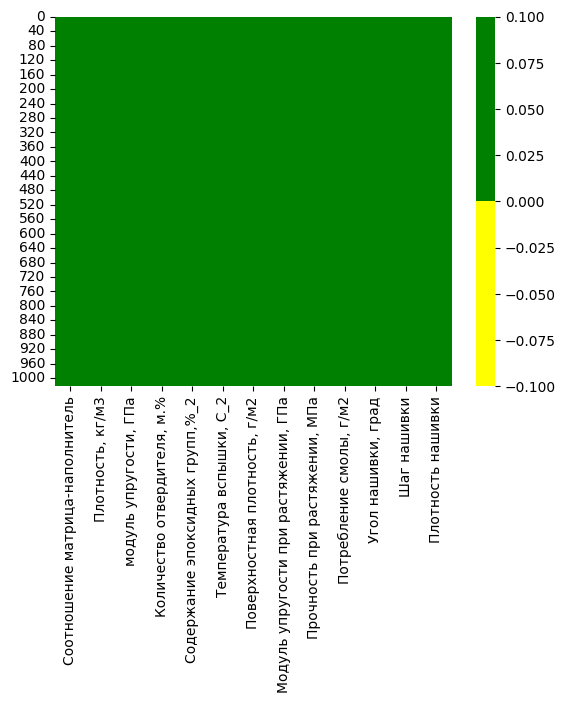

In [126]:
cols = Composite_df.columns[:]
# желтый - пропущенные данные, зеленый - не пропущенные
colours = ['#ffff00', '#008000']
sns.heatmap(Composite_df[cols].isnull(), cmap = sns.color_palette(colours))

In [127]:
for col in Composite_df.columns:
  pct_missing = np.mean(Composite_df[col].isnull())
  print('{} - {}%'.format(col, round(pct_missing*100)))

Соотношение матрица-наполнитель - 0%
Плотность, кг/м3 - 0%
модуль упругости, ГПа - 0%
Количество отвердителя, м.% - 0%
Содержание эпоксидных групп,%_2 - 0%
Температура вспышки, С_2 - 0%
Поверхностная плотность, г/м2 - 0%
Модуль упругости при растяжении, ГПа - 0%
Прочность при растяжении, МПа - 0%
Потребление смолы, г/м2 - 0%
Угол нашивки, град - 0%
Шаг нашивки - 0%
Плотность нашивки - 0%


In [128]:
# Проверим датасет на дубликаты
Composite_df.duplicated().sum()

0

In [129]:
# Получим среднее и медианное значения данных в колонках
mean_and_50 = Composite_df.describe()
mean_and_50.loc[['mean', '50%']]

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,0.491691,6.899222,57.153929
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920


In [130]:
# Получим среднее значение
Composite_df.mean()

Соотношение матрица-наполнитель            2.930366
Плотность, кг/м3                        1975.734888
модуль упругости, ГПа                    739.923233
Количество отвердителя, м.%              110.570769
Содержание эпоксидных групп,%_2           22.244390
Температура вспышки, С_2                 285.882151
Поверхностная плотность, г/м2            482.731833
Модуль упругости при растяжении, ГПа      73.328571
Прочность при растяжении, МПа           2466.922843
Потребление смолы, г/м2                  218.423144
Угол нашивки, град                         0.491691
Шаг нашивки                                6.899222
Плотность нашивки                         57.153929
dtype: float64

In [131]:
# Получим среднее значение
Composite_df.median()

Соотношение матрица-наполнитель            2.906878
Плотность, кг/м3                        1977.621657
модуль упругости, ГПа                    739.664328
Количество отвердителя, м.%              110.564840
Содержание эпоксидных групп,%_2           22.230744
Температура вспышки, С_2                 285.896812
Поверхностная плотность, г/м2            451.864365
Модуль упругости при растяжении, ГПа      73.268805
Прочность при растяжении, МПа           2459.524526
Потребление смолы, г/м2                  219.198882
Угол нашивки, град                         0.000000
Шаг нашивки                                6.916144
Плотность нашивки                         57.341920
dtype: float64

Разведочный анализ данных

гистограммы распределения каждой переменной

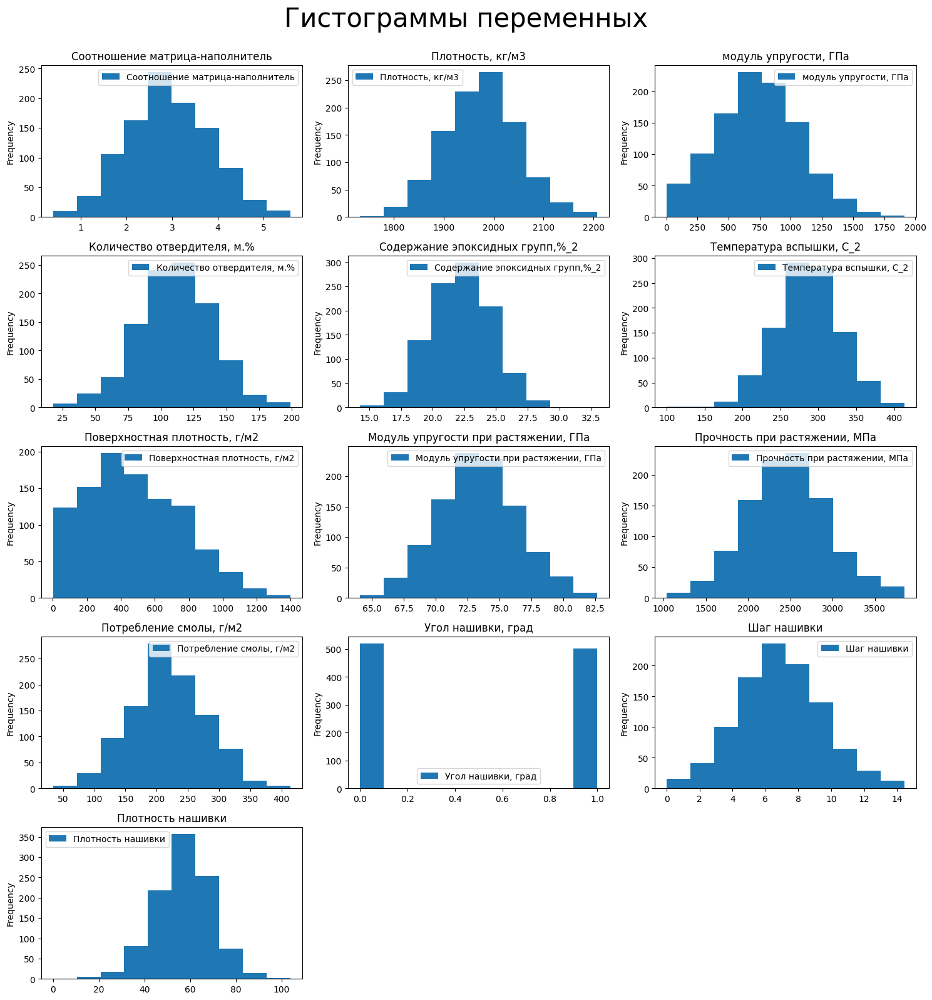

In [132]:
fig = plt.figure(figsize=(15,40))
fig.suptitle('Гистограммы переменных', y = 1,
             fontsize = 30)
total_axes = len(Composite_df.columns) 
subplt = 1 
for x in Composite_df.columns:
    ax = fig.add_subplot(total_axes, 3, subplt)
    Composite_df[x].plot(kind="hist")
    plt.legend()
    ax.set_title(x)
    subplt+=1

plt.tight_layout()
plt.show()

диаграммы ящика с усами каждой переменной

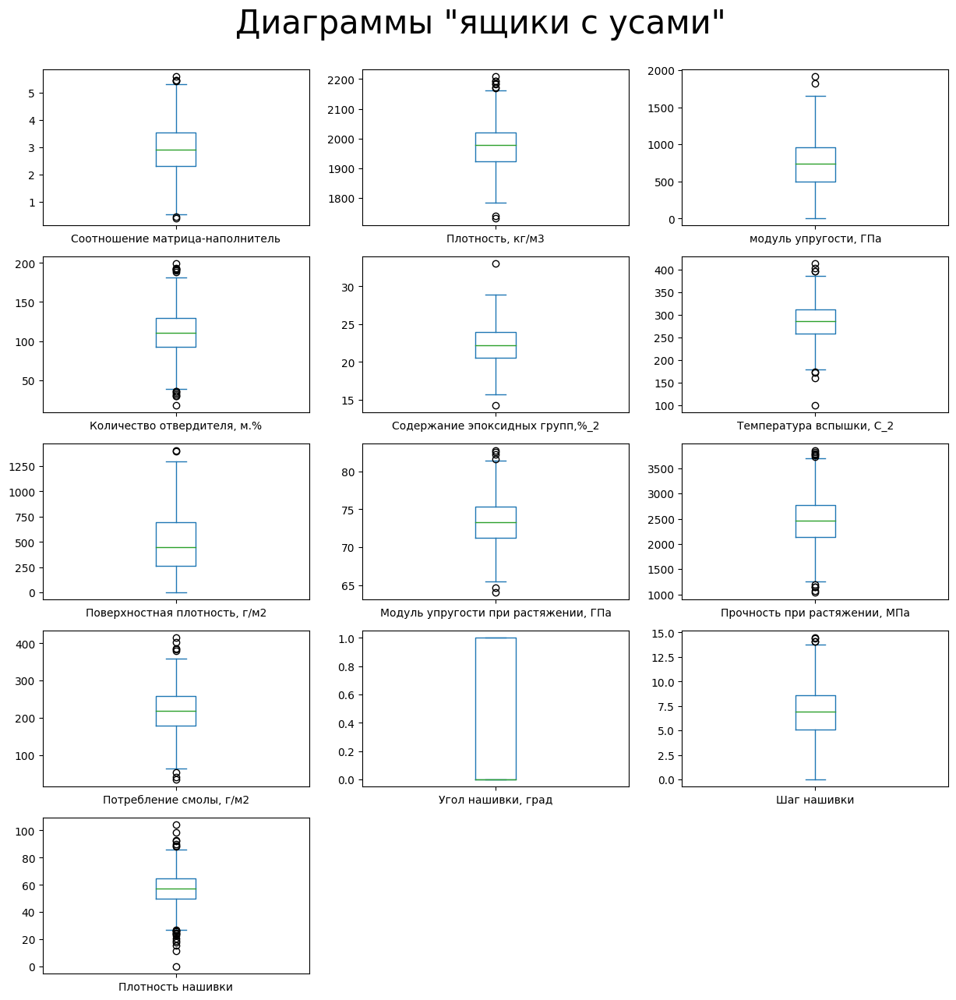

In [133]:
fig = plt.figure(figsize=(15,40))
fig.suptitle('Диаграммы "ящики с усами"', y = 0.9 ,
             fontsize = 30)
total_axes = len(Composite_df.columns) 
subplt = 1 
for x in Composite_df.columns:
    ax = fig.add_subplot(total_axes, 3, subplt)
    Composite_df[x].plot(kind="box")
   
    subplt+=1

plt.show()

попарные графики рассеяния

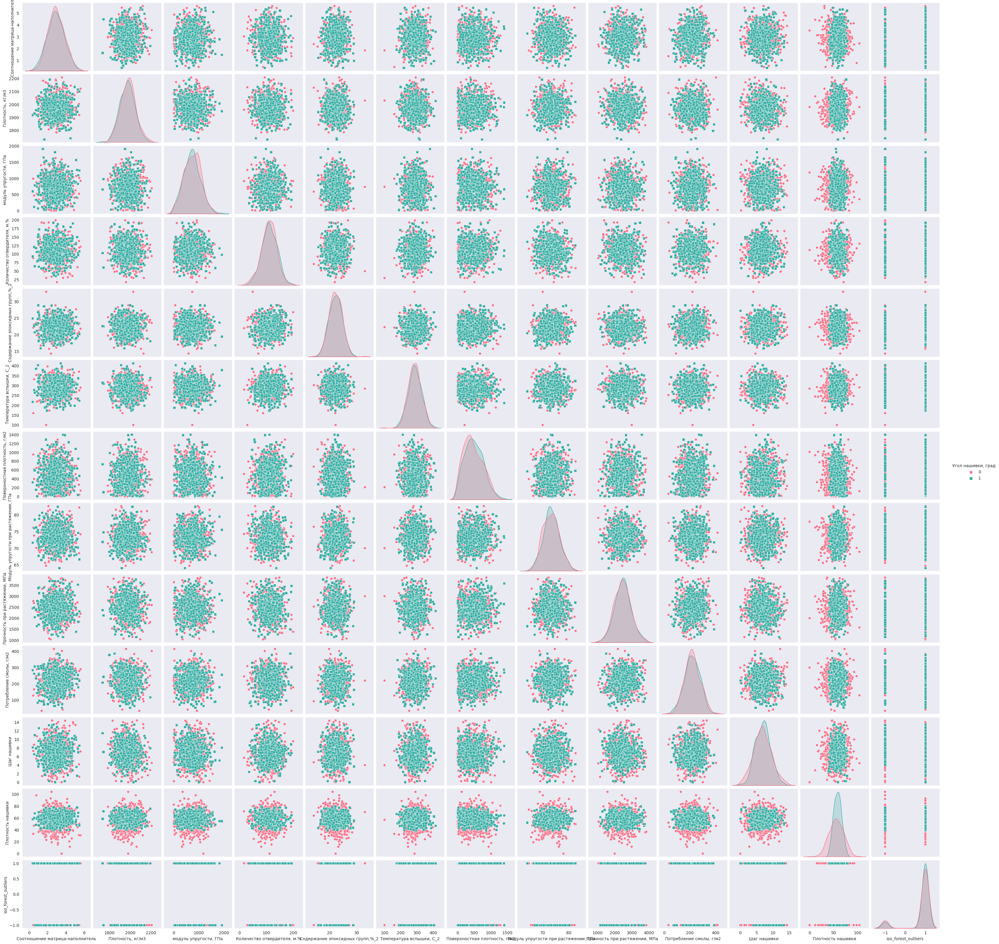

In [139]:
sns.set_style('dark')
sns.pairplot(Composite_df, hue = 'Угол нашивки, град', markers = ["o", "s"], diag_kind = 'auto', palette='husl')

Нормализация и стандартизация

In [140]:
Composite_df_norm = Composite_df.copy()

In [141]:
Composite_df_norm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 14 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

<Axes: ylabel='Density'>

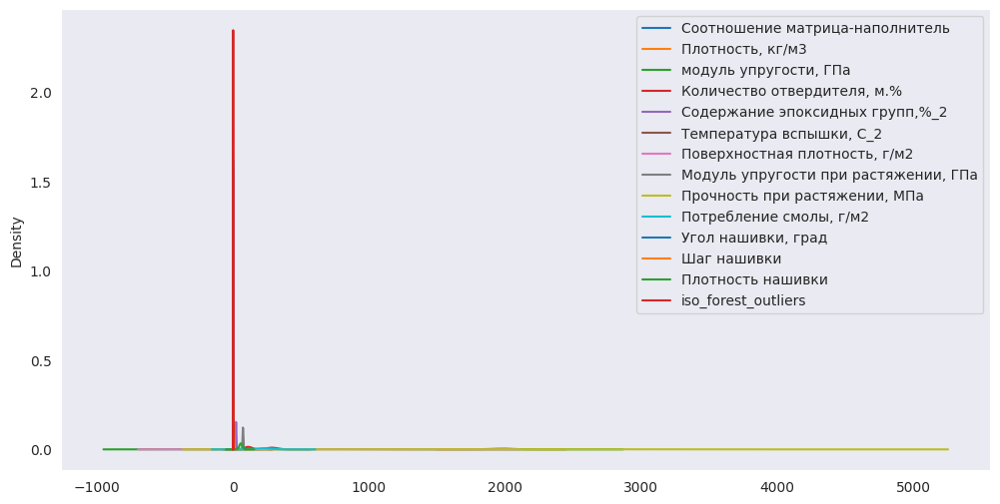

In [142]:
fig, ax = plt.subplots(figsize = (12, 6))
Composite_df_norm.plot(kind = 'kde', ax = ax)

In [147]:
# Нормализуем данные c помощью MinMaxScaler()
scaler = preprocessing.MinMaxScaler()
col = Composite_df.columns
result = scaler.fit_transform(Composite_df)

Composite_df_minmax_n = pd.DataFrame(result, columns = col)
Composite_df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,iso_forest_outliers
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616,0.896383
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772,0.304912
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890,1.000000
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423,1.000000
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


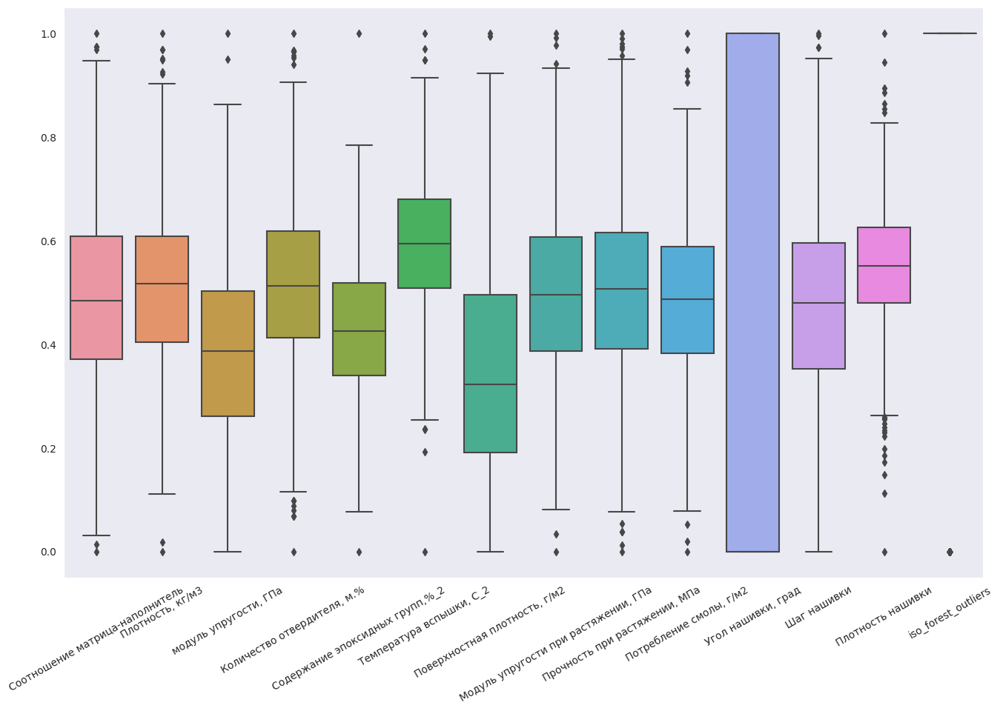

In [148]:
plt.figure(figsize = (16,10))
ax = sns.boxplot(data = Composite_df_minmax_n)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30);

<Axes: ylabel='Density'>

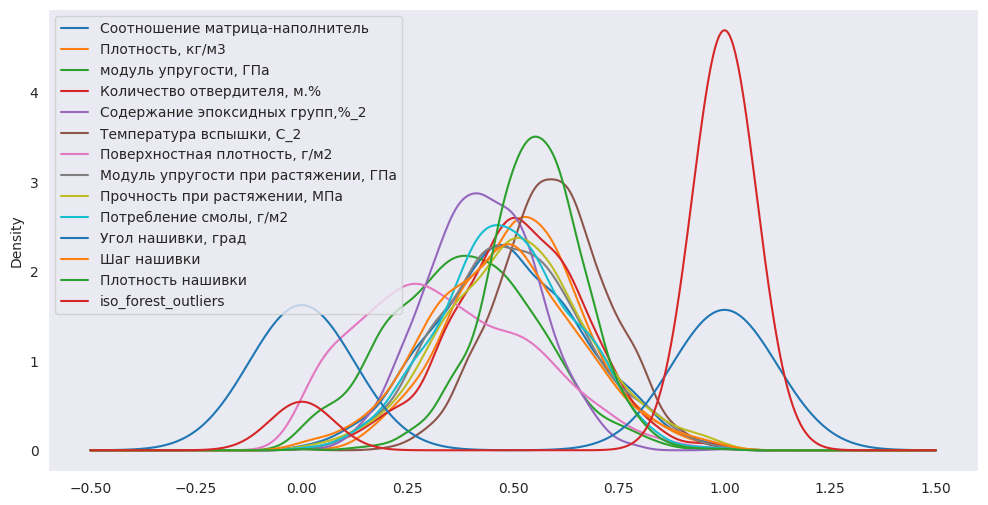

In [149]:
fig, ax = plt.subplots(figsize = (12, 6))
Composite_df_minmax_n.plot(kind = 'kde', ax = ax)

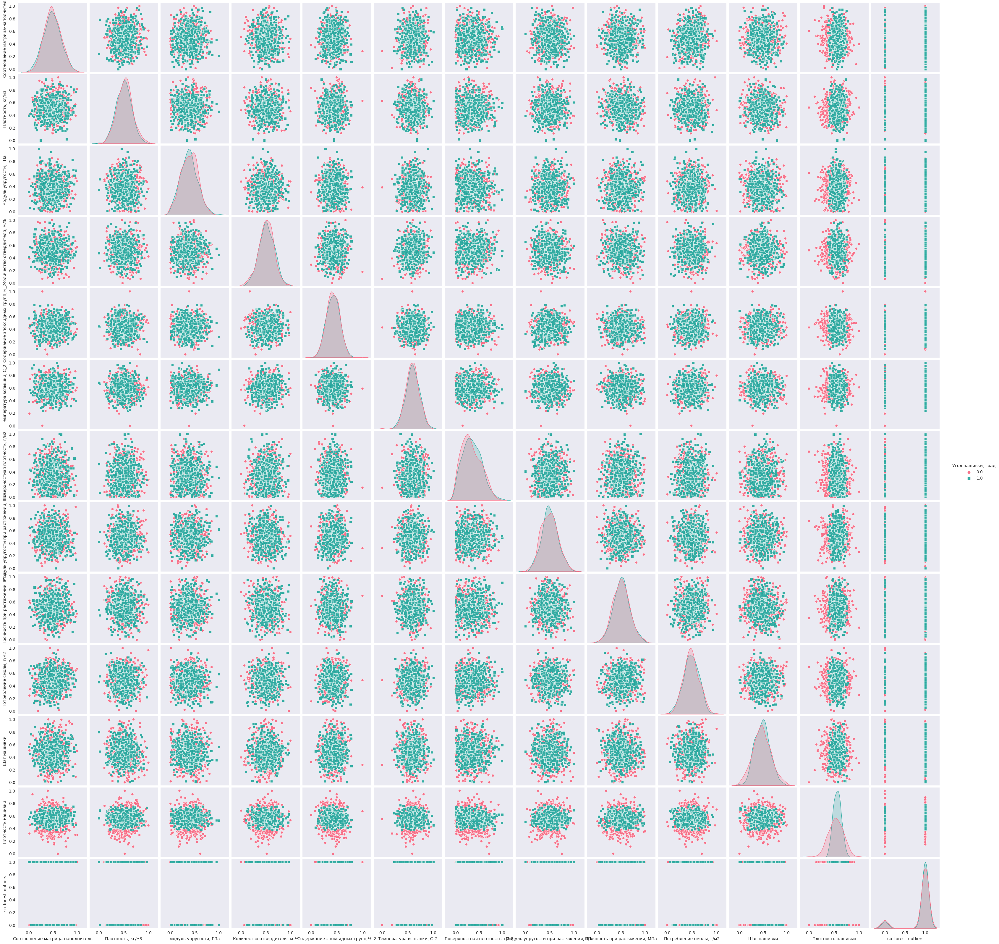

In [152]:
sns.pairplot(Composite_df_minmax_n, hue = 'Угол нашивки, град', markers = ["o", "s"], diag_kind = 'auto', palette = 'husl')

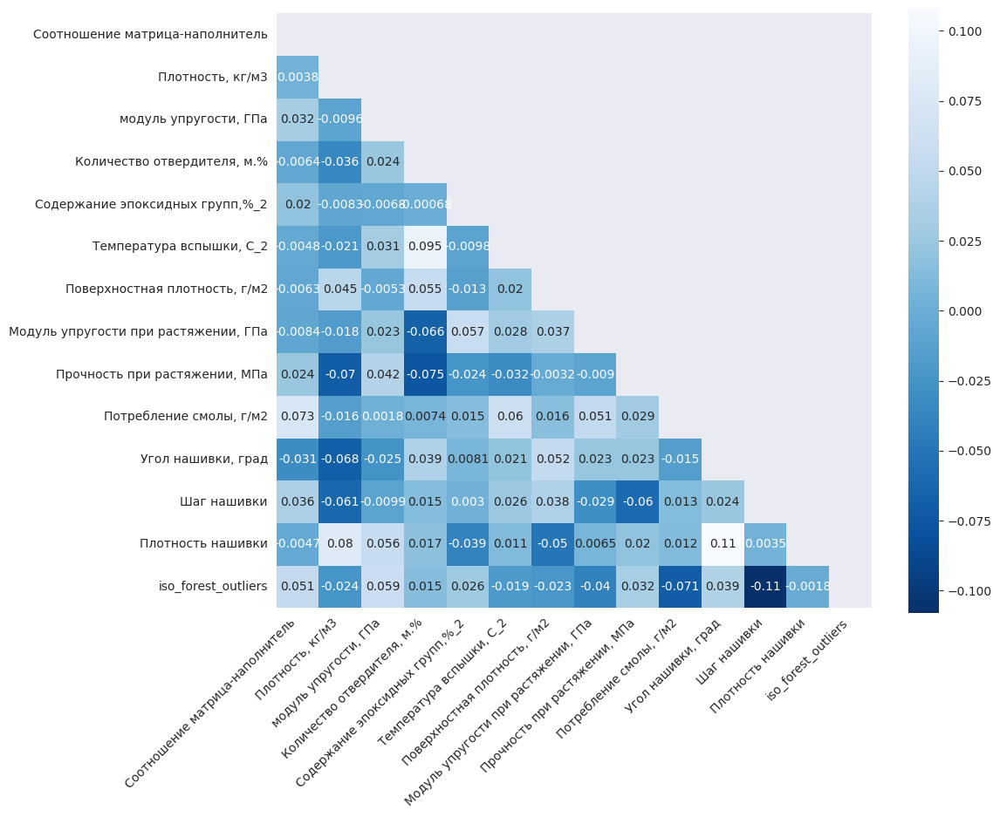

In [154]:
mask = np.triu(Composite_df_minmax_n.corr())
f, ax = plt.subplots(figsize = (11, 9))
sns.heatmap(Composite_df_minmax_n.corr(), mask = mask, annot = True, square = True, cmap = 'Blues_r')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

In [155]:
normalizer = Normalizer()
res = normalizer.fit_transform(Composite_df)
Composite_df_norm_n = pd.DataFrame(res, columns = Composite_df.columns)
Composite_df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,iso_forest_outliers
0,0.000500,0.546880,0.199015,0.008082,0.005999,0.026940,0.056574,0.018858,0.808197,0.059268,0.000000,0.001078,0.015356,-0.000269
1,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121,0.000269
2,0.000499,0.545401,0.198477,0.013407,0.008866,0.076468,0.056421,0.018807,0.806011,0.059107,0.000000,0.001075,0.018807,0.000269
3,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618,0.000268
4,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298,0.000268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.000700,0.601751,0.281397,0.026816,0.006203,0.100115,0.064488,0.022531,0.735908,0.038535,0.000308,0.002798,0.014494,0.000308
1019,0.001078,0.641795,0.139227,0.045701,0.006136,0.079584,0.109777,0.022828,0.738938,0.036856,0.000313,0.003308,0.016827,0.000313
1020,0.000953,0.573123,0.121122,0.032118,0.006961,0.072186,0.215067,0.021716,0.773775,0.068752,0.000291,0.001209,0.019652,0.000291
1021,0.001192,0.664667,0.238453,0.045473,0.006190,0.088689,0.206291,0.023812,0.666248,0.063394,0.000322,0.002030,0.018736,0.000322


<Axes: ylabel='Density'>

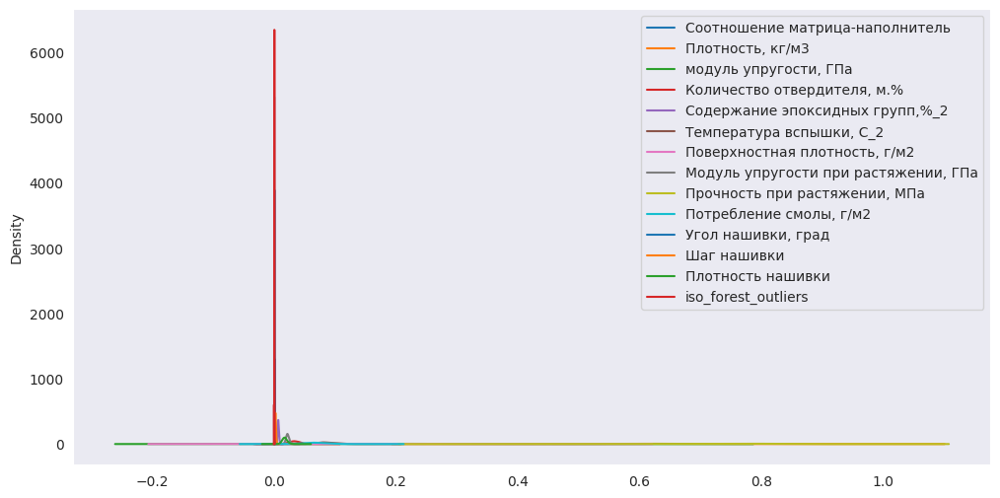

In [156]:
fig, ax = plt.subplots(figsize = (12, 6))
Composite_df_norm_n.plot(kind = 'kde', ax = ax)

Корреляция

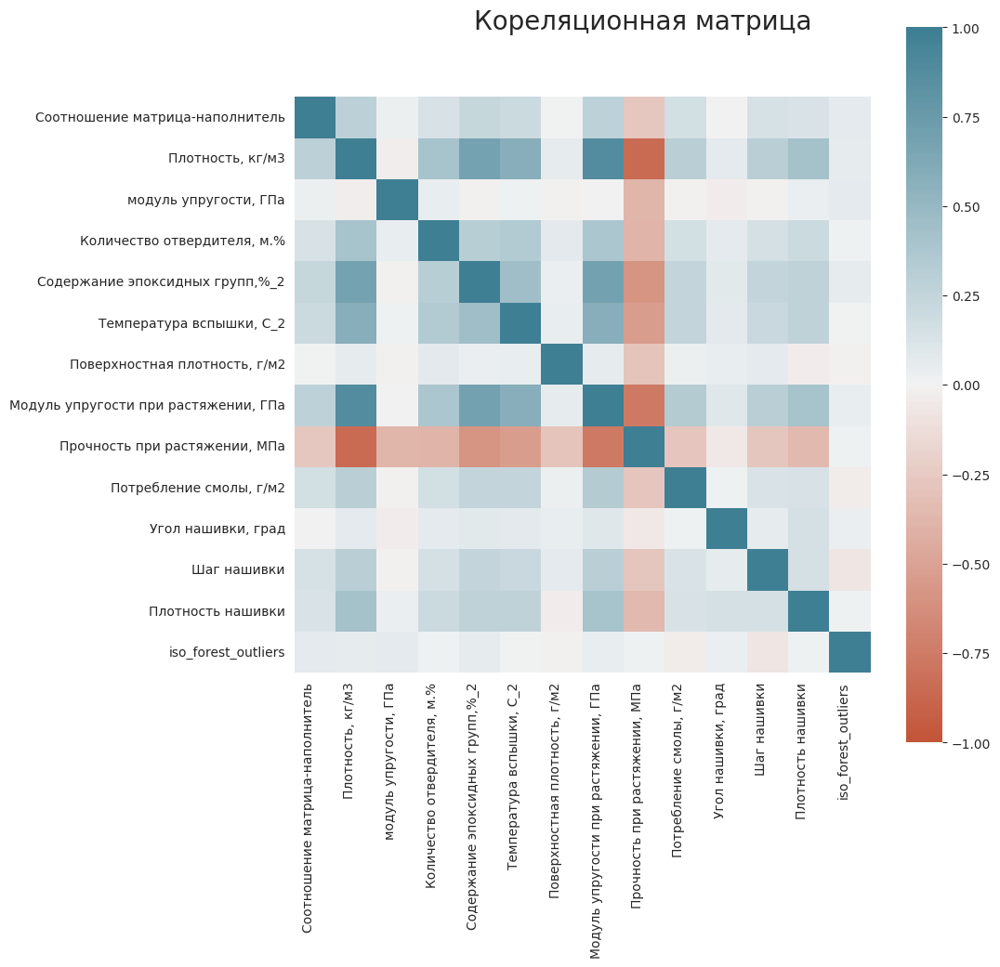

In [160]:
Composite_df_norm_n[Composite_df_norm_n.columns].corr()
fig = plt.figure(figsize=(10,10))
fig.suptitle('Кореляционная матрица', y = 0.9 ,
             fontsize = 20)
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);

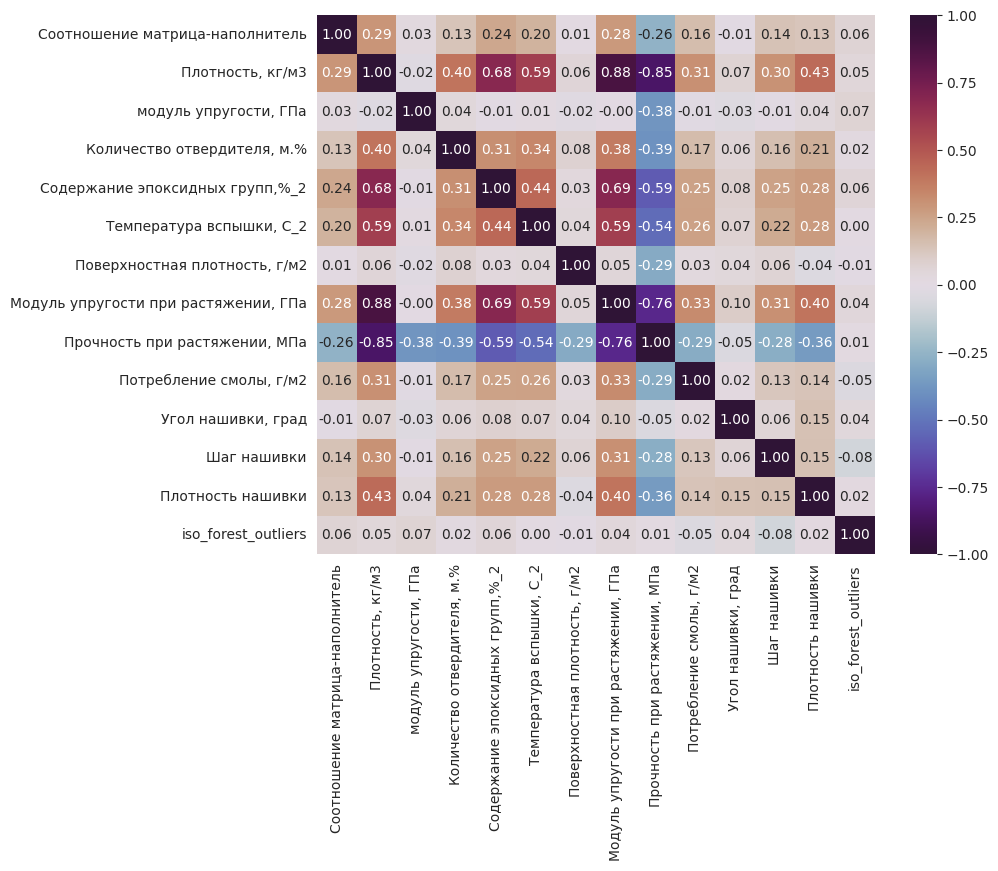

In [161]:
corr = Composite_df_norm_n.corr()
fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

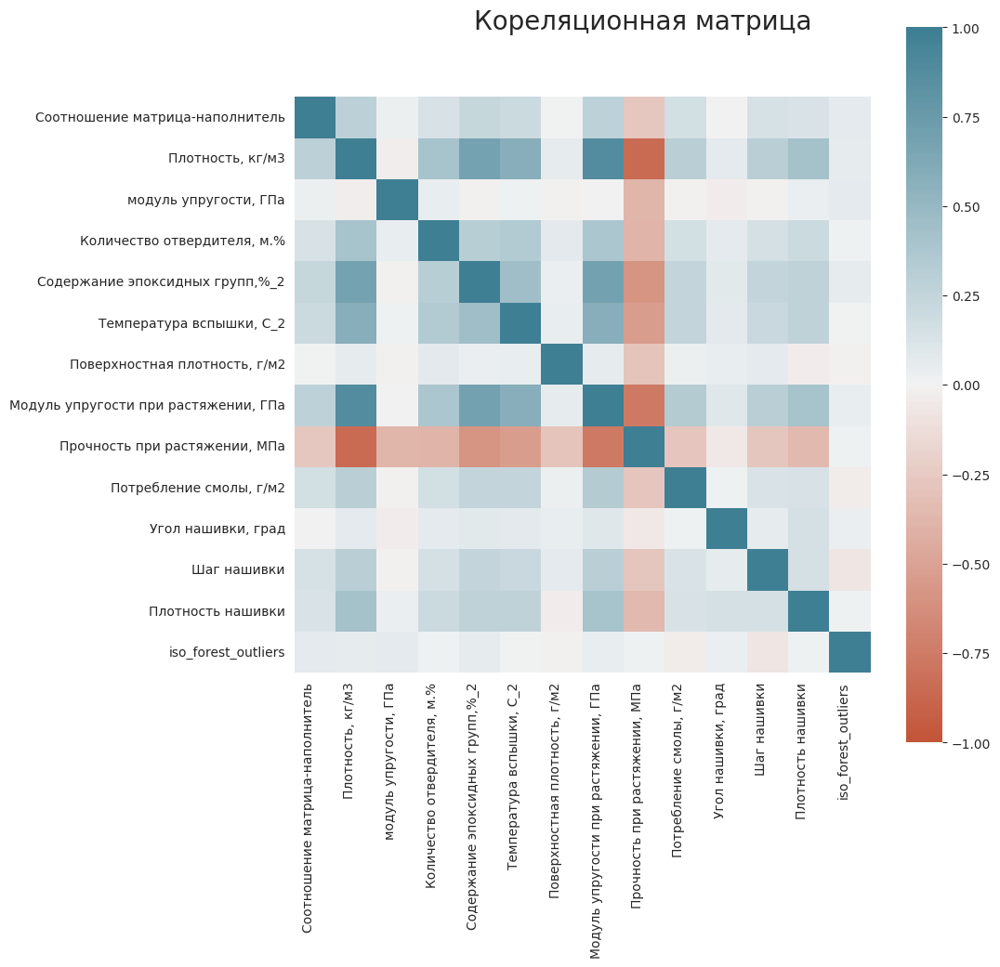

In [163]:
Composite_df_minmax_n[Composite_df_minmax_n.columns].corr()
fig = plt.figure(figsize=(10,10))
fig.suptitle('Кореляционная матрица', y = 0.9 ,
             fontsize = 20)
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);

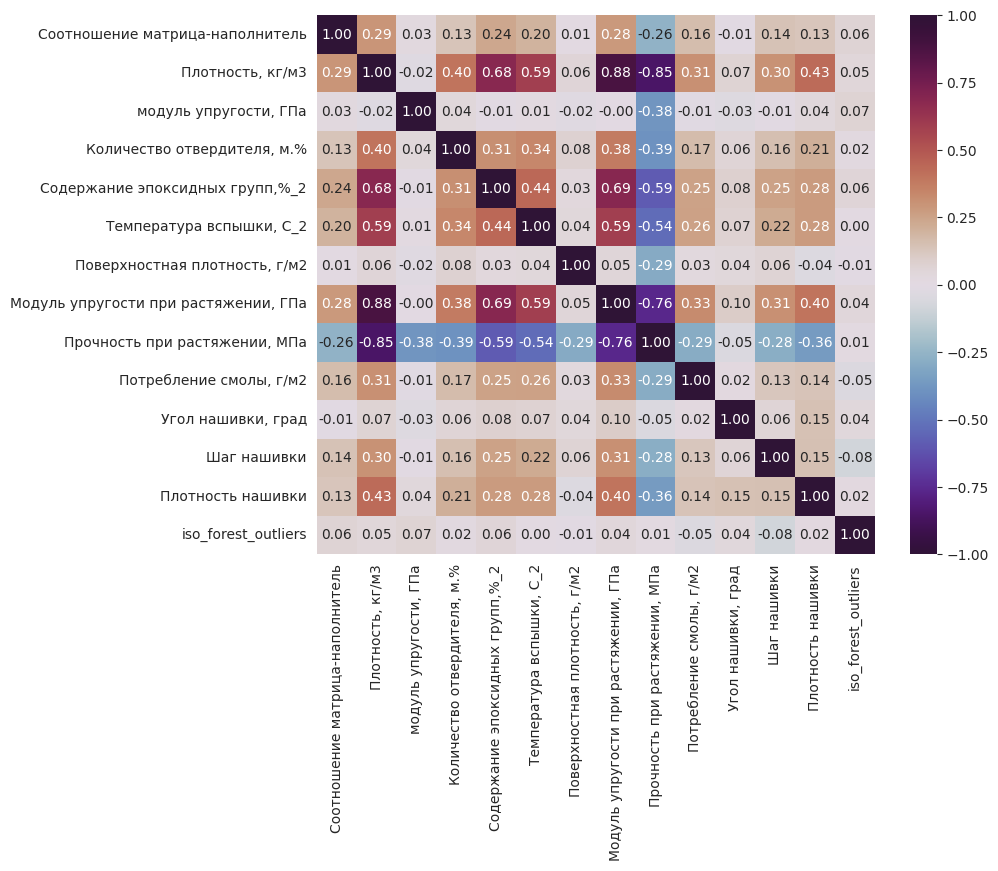

In [164]:
Composite_df_minmax_n[Composite_df_minmax_n.columns].corr()
fig, ax = plt.subplots(figsize=(9, 7))
sns.heatmap(corr, vmin=-1, vmax=1, annot=True, fmt='.2f', cmap='twilight_shifted', ax=ax)
plt.show()

In [165]:
Composite_df_minmax_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,iso_forest_outliers
0,0.282131,0.626533,0.385679,0.067654,0.427467,0.000000,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.548135,0.0
1,0.282131,0.626533,0.385679,0.178021,0.506535,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.576985,1.0
2,0.282131,0.626533,0.385679,0.177469,1.000000,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.276998,0.673149,1.0
3,0.282131,0.626533,0.385679,0.613972,0.373167,0.638420,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.451971,1.0
4,0.457857,0.626533,0.393150,0.519387,0.427467,0.589311,0.149682,0.319194,0.698235,0.488979,0.0,0.346248,0.548135,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.361750,0.462855,0.476884,0.382158,0.313057,0.717503,0.149109,0.485125,0.480312,0.239516,1.0,0.628535,0.452161,1.0
1019,0.587163,0.668737,0.231678,0.707685,0.285131,0.492271,0.250230,0.475992,0.470745,0.220404,1.0,0.731664,0.516890,1.0
1020,0.555750,0.505470,0.217065,0.512067,0.517605,0.473781,0.528643,0.573346,0.578340,0.532590,1.0,0.288158,0.650355,1.0
1021,0.637396,0.703842,0.387114,0.682389,0.266309,0.561107,0.458108,0.536217,0.368070,0.428909,1.0,0.437186,0.560262,1.0


In [166]:
Composite_df_norm_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,iso_forest_outliers
0,0.000500,0.546880,0.199015,0.008082,0.005999,0.026940,0.056574,0.018858,0.808197,0.059268,0.000000,0.001078,0.015356,-0.000269
1,0.000499,0.545436,0.198490,0.013434,0.006381,0.076473,0.056424,0.018808,0.806064,0.059111,0.000000,0.001075,0.016121,0.000269
2,0.000499,0.545401,0.198477,0.013407,0.008866,0.076468,0.056421,0.018807,0.806011,0.059107,0.000000,0.001075,0.018807,0.000269
3,0.000499,0.545011,0.198335,0.034634,0.005705,0.080543,0.056380,0.018793,0.805435,0.059065,0.000000,0.001342,0.012618,0.000268
4,0.000744,0.544829,0.202097,0.030022,0.005976,0.076388,0.056362,0.018787,0.805167,0.059046,0.000000,0.001342,0.015298,0.000268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.000700,0.601751,0.281397,0.026816,0.006203,0.100115,0.064488,0.022531,0.735908,0.038535,0.000308,0.002798,0.014494,0.000308
1019,0.001078,0.641795,0.139227,0.045701,0.006136,0.079584,0.109777,0.022828,0.738938,0.036856,0.000313,0.003308,0.016827,0.000313
1020,0.000953,0.573123,0.121122,0.032118,0.006961,0.072186,0.215067,0.021716,0.773775,0.068752,0.000291,0.001209,0.019652,0.000291
1021,0.001192,0.664667,0.238453,0.045473,0.006190,0.088689,0.206291,0.023812,0.666248,0.063394,0.000322,0.002030,0.018736,0.000322


In [167]:
# Стандартизируем данные
X1 = Composite_df_minmax_n.copy()
X2 = Composite_df_norm_n.copy()

In [168]:
Composite_df_std_X1 = preprocessing.StandardScaler().fit(X1)
Composite_df_standart_X1 = Composite_df_std_X1.transform(X1)
Composite_df_standart_1 = pd.DataFrame(Composite_df_standart_X1)

<Axes: ylabel='Density'>

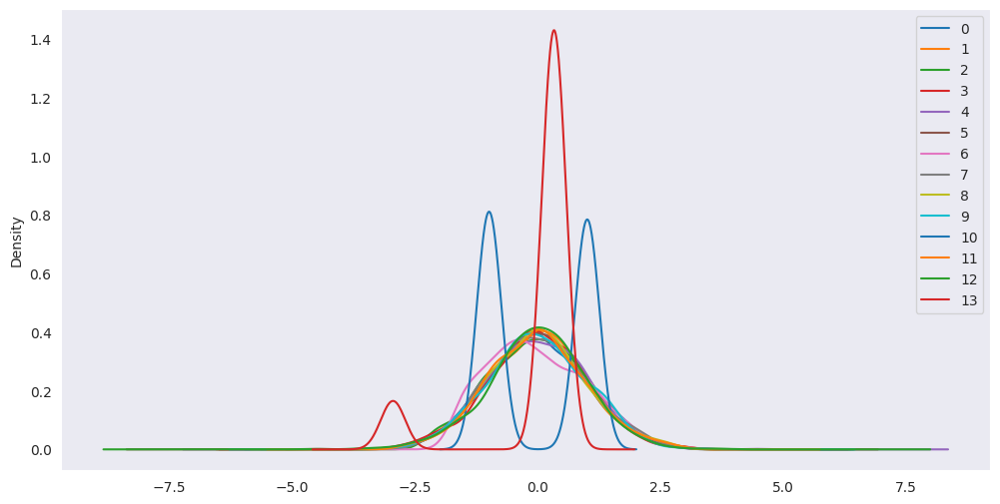

In [169]:
fig, ax = plt.subplots(figsize = (12, 6))
Composite_df_standart_1.plot(kind = 'kde', ax = ax)

In [170]:
Composite_df_standart_1

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-1.175779,0.736365,-0.003594,-2.848828,0.009757,-4.542215,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-1.131530,-0.012469,-2.941249
1,-1.175779,0.736365,-0.003594,-2.141666,0.626001,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-1.131530,0.230546,0.339992
2,-1.175779,0.736365,-0.003594,-2.145202,4.471955,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-1.131530,1.040595,0.339992
3,-1.175779,0.736365,-0.003594,0.651622,-0.413446,0.344984,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-0.741243,-0.822518,0.339992
4,-0.174232,0.736365,0.039618,0.045585,0.009757,-0.030955,-0.969964,-1.067720,1.098244,0.026410,-0.983518,-0.741243,-0.012469,0.339992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,-0.721995,-0.320884,0.523926,-0.833694,-0.881925,0.950375,-0.972814,-0.076219,-0.164054,-1.564572,1.016758,0.849718,-0.820917,0.339992
1019,0.562741,1.008971,-0.894327,1.252072,-1.099577,-0.773808,-0.469707,-0.130794,-0.219473,-1.686461,1.016758,1.430947,-0.275671,0.339992
1020,0.383707,-0.045622,-0.978843,-0.001319,0.712276,-0.915350,0.915476,0.450935,0.403764,0.304549,1.016758,-1.068634,0.848588,0.339992
1021,0.849043,1.235730,0.004703,1.089990,-1.246274,-0.246860,0.564542,0.229077,-0.814204,-0.356695,1.016758,-0.228717,0.089684,0.339992


In [171]:
Composite_df_std_X2 = preprocessing.StandardScaler().fit(X2)
Composite_df_standart_X2 = Composite_df_std_X2.transform(X2)
Composite_df_standart_2 = pd.DataFrame(Composite_df_standart_X2)

<Axes: ylabel='Density'>

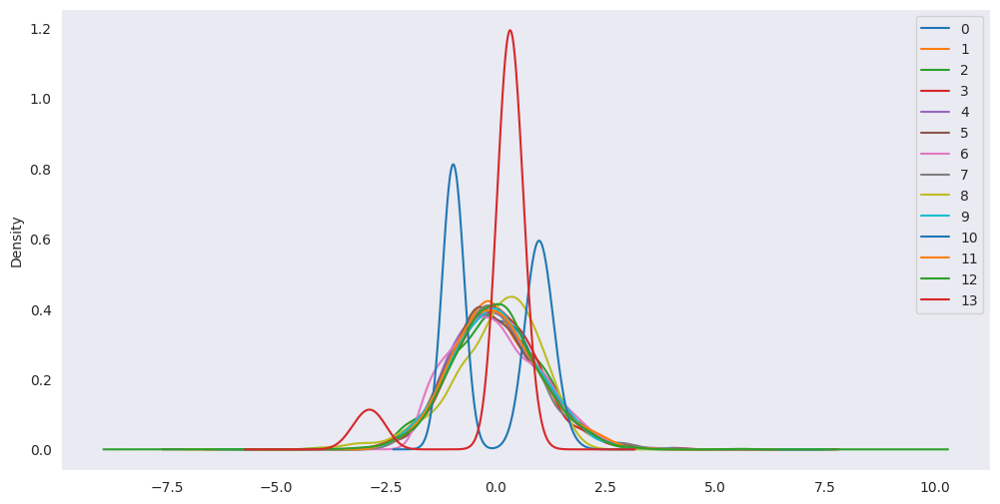

In [172]:
fig, ax = plt.subplots(figsize = (12, 6))
Composite_df_standart_2.plot(kind = 'kde', ax=ax)

In [173]:
Composite_df_standart_2

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-1.313175,-0.730164,-0.227196,-2.664738,-0.686210,-3.768711,-1.049860,-1.252529,1.060042,-0.345348,-0.971499,-1.220095,-0.455856,-2.699918
1,-1.317685,-0.751212,-0.232655,-2.102891,-0.324578,-0.630195,-1.051640,-1.271404,1.031101,-0.353456,-0.971499,-1.223521,-0.272652,0.158756
2,-1.317797,-0.751733,-0.232790,-2.105803,2.025257,-0.630513,-1.051684,-1.271871,1.030384,-0.353657,-0.971499,-1.223606,0.370065,0.158662
3,-1.319015,-0.757418,-0.234264,0.122413,-0.964029,-0.372262,-1.052165,-1.276968,1.022568,-0.355846,-0.971499,-0.901058,-1.110925,0.157642
4,-0.481604,-0.760064,-0.195170,-0.361682,-0.707481,-0.635588,-1.052389,-1.279341,1.018930,-0.356866,-0.971499,-0.901597,-0.469634,0.157167
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,-0.630608,0.069974,0.628904,-0.698189,-0.493039,0.867845,-0.955519,0.140318,0.079287,-1.419931,1.046036,0.852584,-0.662003,0.368991
1019,0.660419,0.653891,-0.848503,1.284124,-0.556735,-0.433060,-0.415628,0.253068,0.120396,-1.506936,1.077430,1.466754,-0.103744,0.394475
1020,0.233800,-0.347487,-1.036640,-0.141629,0.224038,-0.901836,0.839533,-0.168765,0.593034,0.146224,0.930289,-1.061618,0.572191,0.275036
1021,1.047845,0.987414,0.182636,1.260172,-0.505832,0.143841,0.734916,0.625896,-0.865791,-0.131471,1.133293,-0.072264,0.353171,0.439820


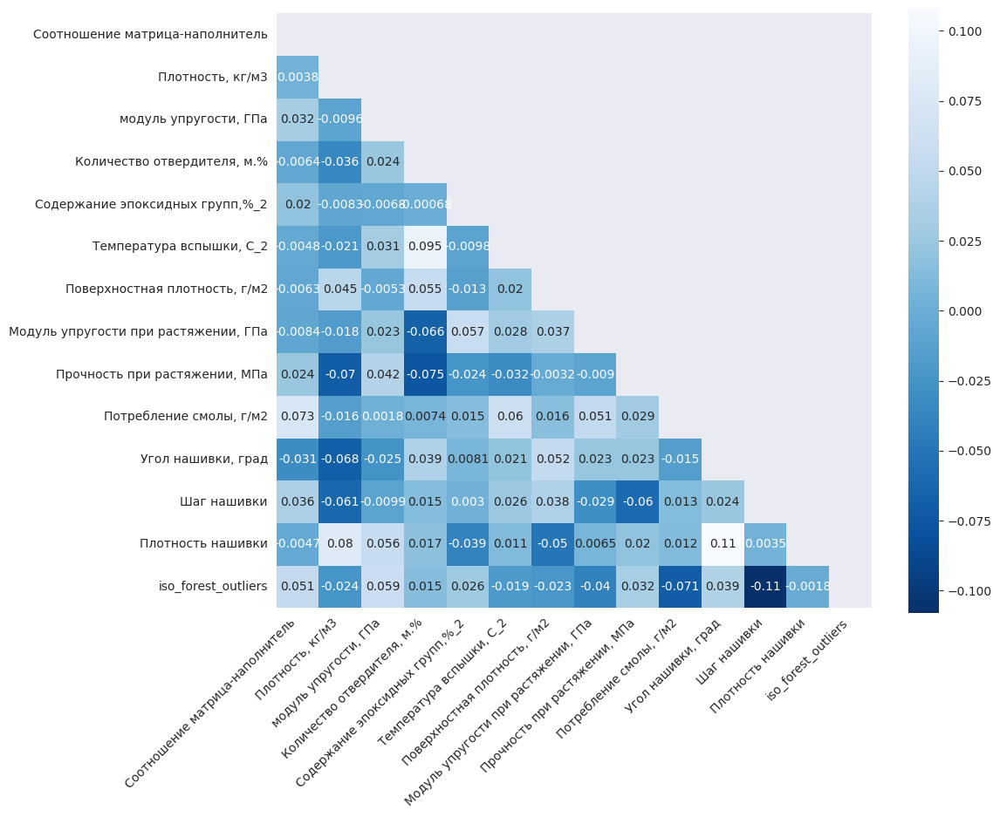

In [174]:
mask = np.triu(X1.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X1.corr(), mask=mask, annot=True, square=True, cmap='Blues_r')
plt.xticks(rotation=45, ha='right')
plt.show()

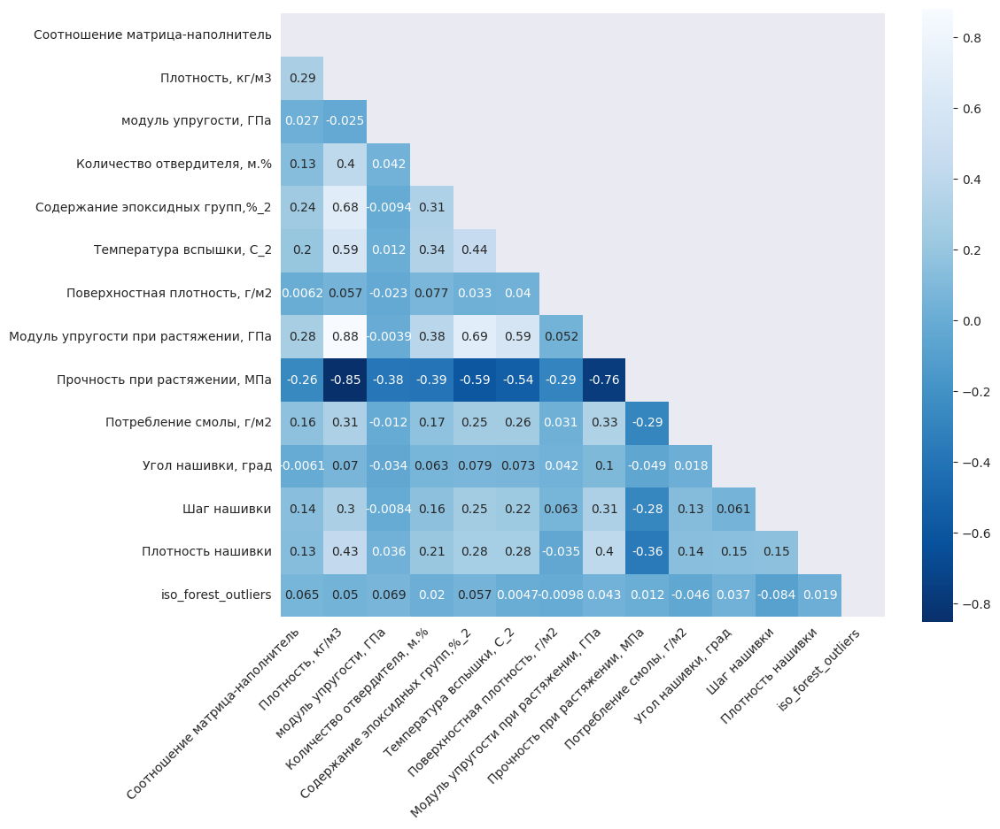

In [175]:
mask = np.triu(X2.corr())
f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(X2.corr(), mask=mask, annot=True, square=True, cmap='Blues_r')
plt.xticks(rotation=45, ha='right')
plt.show()

In [176]:
Composite_df_norm_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,iso_forest_outliers
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.000885,0.596953,0.220878,0.033468,0.006725,0.086419,0.144642,0.022161,0.730064,0.065931,0.000148,0.002090,0.017261,0.000239
std,0.000293,0.068611,0.096277,0.009531,0.001058,0.015790,0.083927,0.002638,0.073744,0.019303,0.000153,0.000830,0.004181,0.000188
min,0.000121,0.420442,0.000709,0.004565,0.004051,0.026940,0.000230,0.015231,0.430381,0.010717,0.000000,0.000000,0.000000,-0.000419
25%,0.000680,0.551086,0.150959,0.027296,0.005971,0.075643,0.080862,0.020346,0.687082,0.052585,0.000000,0.001512,0.014609,0.000271
50%,0.000871,0.591654,0.220275,0.033316,0.006658,0.084935,0.138227,0.021962,0.740396,0.065397,0.000000,0.002040,0.017216,0.000294
75%,0.001070,0.641143,0.290944,0.039499,0.007404,0.096638,0.202736,0.023816,0.781526,0.078239,0.000298,0.002620,0.019773,0.000320
max,0.001924,0.874455,0.525102,0.073492,0.010887,0.147961,0.414371,0.033015,0.882446,0.145392,0.000419,0.004953,0.040218,0.000417


In [177]:
Composite_df_minmax_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,iso_forest_outliers
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,0.488427,0.512533,0.386301,0.512273,0.426215,0.593354,0.344638,0.497880,0.508634,0.484838,0.491691,0.477768,0.549616,0.896383
std,0.175541,0.154890,0.172978,0.156147,0.128370,0.130695,0.201092,0.167435,0.172724,0.156875,0.500175,0.177519,0.118772,0.304912
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.370696,0.404175,0.260652,0.412240,0.338919,0.507756,0.190296,0.386030,0.390881,0.382955,0.000000,0.351790,0.478890,1.000000
50%,0.483912,0.516497,0.386165,0.512240,0.425487,0.593401,0.322574,0.494672,0.506003,0.486875,0.000000,0.478940,0.551423,1.000000
75%,0.608045,0.608413,0.502528,0.618003,0.517842,0.679924,0.495105,0.606751,0.615432,0.587411,1.000000,0.594597,0.624537,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Обучение моделей

Прогнозируем прочности при растяжении

In [193]:
#разбиваем на тестовую, тренировочную выборки, выделяя предикторы и целевые переменные
X_train, X_test, y_train, y_test = train_test_split(
    Composite_df_norm_n[['Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки','Угол нашивки, град']],
    Composite_df_norm_n[['Прочность при растяжении, МПа']],
       test_size=0.3,
    random_state=42)

In [194]:
X_train.head()

,"Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки,"Угол нашивки, град"
604,0.031485,0.010887,0.131189,0.003794,0.067324,0.004305,0.030927,0.000419
227,0.057009,0.008913,0.108783,0.261740,0.052528,0.002442,0.015980,0.000000
970,0.047082,0.007222,0.091043,0.087543,0.065502,0.001402,0.014981,0.000310
497,0.031409,0.007491,0.079884,0.087151,0.049640,0.000217,0.024992,0.000000
919,0.040700,0.007937,0.077289,0.029348,0.025868,0.002254,0.022783,0.000340


In [195]:
y_train

,"Прочность при растяжении, МПа"
604,0.586813
227,0.493076
970,0.716769
497,0.698192
919,0.669145
...,...
106,0.843080
270,0.430381
860,0.720306
435,0.578671


In [196]:
y_train.shape

(716, 1)

In [201]:
type(y_train)

pandas.core.frame.DataFrame

In [202]:
np.ravel(y_train).shape

(716,)

In [203]:
type(np.ravel(y_train))

numpy.ndarray

Регрессия опорных векторов 
SVR

In [204]:
svr = make_pipeline(StandardScaler(), SVR(kernel='rbf', C=500.0, epsilon=1.0))
svr.fit(X_train, np.ravel(y_train))
y_pred_svr=svr.predict(X_test)
print('SVR Results Train:')
print("Test score: {:.2f}".format(svr.score(X_train, y_train)))

SVR Results Train:
Test score: -1.00


In [205]:
print('SVR Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test, y_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_svr)))
print("Test score: {:.2f}".format(svr.score(X_test, y_test)))

SVR Results:
SVR_MAE: 0
SVR_MAPE: 0.12
Test score: -1.00


In [206]:
RFreg = RandomForestRegressor(n_estimators=15,max_depth=7, random_state=33)
RFreg.fit(X_train, np.ravel(y_train))
y_pred_RF=RFreg.predict(X_test)
print('Random Forest Regressor Results Train:')
print("Test score: {:.2f}".format(svr.score(X_train, y_train)))

Random Forest Regressor Results Train:
Test score: -1.00


In [207]:
print('Random Forest Regressor Results:')
print('RF_MAE: ', round(mean_absolute_error(y_test, y_pred_RF)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_RF)))
print("Test score: {:.2f}".format(RFreg.score(X_test, y_test)))

Random Forest Regressor Results:
RF_MAE:  0
RF_MAPE: 0.05
Test score: 0.55


In [208]:
LR = make_pipeline(StandardScaler(), LinearRegression())
LR.fit(X_train, np.ravel(y_train))
y_pred_LR=LR.predict(X_test)
print('Linear Regression Results Train:')
print("Test score: {:.2f}".format(LR.score(X_train, y_train)))
print('Linear Regression Results:')
print('LR_MAE: ', round(mean_absolute_error(y_test, y_pred_LR)))
print('LR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_LR)))
print("Test score: {:.2f}".format(LR.score(X_test, y_test)))

Linear Regression Results Train:
Test score: 0.56
Linear Regression Results:
LR_MAE:  0
LR_MAPE: 0.05
Test score: 0.59


In [209]:
GBR = make_pipeline(StandardScaler(), GradientBoostingRegressor())
GBR.fit(X_train, np.ravel(y_train))
y_pred_GBR=GBR.predict(X_test)
print('Gradient Boosting Regressor Results Train:')
print("Test score: {:.2f}".format(GBR.score(X_train, y_train)))
print('Gradient Boosting Regressor Results:')
print('GBR_MAE: ', round(mean_absolute_error(y_test, y_pred_GBR)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_GBR)))
print("Test score: {:.2f}".format(GBR.score(X_test, y_test)))

Gradient Boosting Regressor Results Train:
Test score: 0.84
Gradient Boosting Regressor Results:
GBR_MAE:  0
GBR_MAPE: 0.05
Test score: 0.59


Подбор параметров для прогноза прочности при растяжении

In [211]:
pipe = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators=100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]}]
grid = GridSearchCV(pipe, param_grid, cv=10)
grid.fit(X_train, np.ravel(y_train))
print("Наилучшие параметры:\n{}\n".format(grid.best_params_))
print("Наилучшее значение правильности перекр проверки: {:.2f}".format(grid.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid.score(X_test, y_test)))

Наилучшие параметры:
{'preprocessing': None, 'regressor': GradientBoostingRegressor()}

Наилучшее значение правильности перекр проверки: 0.58
Правильность на тестовом наборе: 0.59


In [212]:
print("Наилучшая модель:\n{}".format(grid.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', None),
                ('regressor', GradientBoostingRegressor())])


In [213]:
results = pd.DataFrame(grid.cv_results_)
display(results.tail())

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessing,param_regressor,param_regressor__C,param_regressor__gamma,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
112,0.005066,0.000736,0.001950,0.000197,MinMaxScaler(),LinearRegression(),NaN,NaN,"{'preprocessing': MinMaxScaler(), 'regressor':...",0.495948,...,0.481167,0.443136,0.585568,0.501747,0.590499,0.538768,0.567781,0.535645,0.050194,7
113,0.002946,0.000110,0.001541,0.000047,None,LinearRegression(),NaN,NaN,"{'preprocessing': None, 'regressor': LinearReg...",0.495948,...,0.481167,0.443136,0.585568,0.501747,0.590499,0.538768,0.567781,0.535645,0.050194,9
114,0.221293,0.005573,0.002312,0.000057,StandardScaler(),GradientBoostingRegressor(),NaN,NaN,"{'preprocessing': StandardScaler(), 'regressor...",0.543493,...,0.476176,0.525775,0.616724,0.550006,0.658270,0.582728,0.489539,0.568905,0.061625,3
115,0.294479,0.039209,0.003050,0.000381,MinMaxScaler(),GradientBoostingRegressor(),NaN,NaN,"{'preprocessing': MinMaxScaler(), 'regressor':...",0.544661,...,0.474881,0.524489,0.616001,0.555502,0.657989,0.583428,0.484357,0.568926,0.062546,2
116,0.228679,0.025507,0.002212,0.000219,None,GradientBoostingRegressor(),NaN,NaN,"{'preprocessing': None, 'regressor': GradientB...",0.540058,...,0.459460,0.559735,0.621480,0.538701,0.648210,0.592511,0.536618,0.575184,0.057830,1


In [214]:
results = pd.DataFrame(grid.cv_results_)
# мы выводим транспонированную таблицу для лучшего отображения на странице:
display(results.T)

,0,1,2,3,4,5,6,7,8,9,...,107,108,109,110,111,112,113,114,115,116
mean_fit_time,0.043619,0.028657,0.012897,0.012629,0.015284,0.014969,0.014532,0.011114,0.011268,0.012983,...,0.05609,0.534789,0.558996,0.474468,0.005584,0.005066,0.002946,0.221293,0.294479,0.228679
std_fit_time,0.009596,0.012919,0.002349,0.000483,0.000844,0.00295,0.004991,0.002183,0.003491,0.002196,...,0.025046,0.10673,0.115004,0.007909,0.001015,0.000736,0.00011,0.005573,0.039209,0.025507
mean_score_time,0.013999,0.006438,0.005589,0.004626,0.005098,0.005475,0.004013,0.005025,0.004508,0.004915,...,0.003573,0.013961,0.012999,0.012137,0.002032,0.00195,0.001541,0.002312,0.00305,0.002212
std_score_time,0.007354,0.003826,0.002976,0.001056,0.00198,0.002022,0.000193,0.002342,0.001592,0.001888,...,0.000187,0.00425,0.002889,0.002709,0.000386,0.000197,0.000047,0.000057,0.000381,0.000219
param_preprocessing,StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),...,None,StandardScaler(),MinMaxScaler(),None,StandardScaler(),MinMaxScaler(),None,StandardScaler(),MinMaxScaler(),None
param_regressor,SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),...,SVR(),RandomForestRegressor(),RandomForestRegressor(),RandomForestRegressor(),LinearRegression(),LinearRegression(),LinearRegression(),GradientBoostingRegressor(),GradientBoostingRegressor(),GradientBoostingRegressor()
param_regressor__C,0.001,0.001,0.001,0.001,0.001,0.001,0.01,0.01,0.01,0.01,...,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
param_regressor__gamma,0.001,0.01,0.1,1,10,100,0.001,0.01,0.1,1,...,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
params,"{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...",...,"{'preprocessing': None, 'regressor': SVR(), 'r...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': MinMaxScaler(), 'regressor':...","{'preprocessing': None, 'regressor': RandomFor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': MinMaxScaler(), 'regressor':...","{'preprocessing': None, 'regressor': LinearReg...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': MinMaxScaler(), 'regressor':...","{'preprocessing': None, 'regressor': GradientB..."
split0_test_score,-0.016161,0.047794,0.075026,-0.023647,-0.027888,-0.028024,0.05959,0.218552,0.21825,-0.003628,...,0.210016,0.589526,0.593181,0.555276,0.495948,0.495948,0.495948,0.543493,0.544661,0.540058


In [216]:
svr = SVR(kernel='rbf', C=100.0, gamma=0.001)
svr.fit(X_train, np.ravel(y_train))
y_pred_svr=svr.predict(X_test)
print('SVR Results Train:')
print("Test score: {:.2f}".format(svr.score(X_train, y_train)))

SVR Results Train:
Test score: 0.13


In [217]:
print('SVR Results:')
print('SVR_MAE:', round(mean_absolute_error(y_test, y_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y_test, y_pred_svr)))
print("Test score: {:.2f}".format(svr.score(X_test, y_test)))

SVR Results:
SVR_MAE: 0
SVR_MAPE: 0.08
Test score: 0.15


Прогрозируем модуль упругости

In [220]:
X1_train, X1_test, y1_train, y1_test = train_test_split(
    Composite_df_norm_n[['Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки','Угол нашивки, град', 'Угол нашивки, град']],
    Composite_df_norm_n[['Модуль упругости при растяжении, ГПа']],
       test_size=0.3,
    random_state=42)

Регрессия опорного вектора

In [ ]:
svr = make_pipeline(StandardScaler(), SVR(kernel='rbf', C=500.0, epsilon=1.0))
svr.fit(X1_train, np.ravel(y1_train))
y1_pred_svr=svr.predict(X1_test)
print('Support Vector Regression Results Train:')
print("Test score: {:.2f}".format(svr.score(X1_train, y1_train)))

Support Vector Regression Results Train:
Test score: 0.82


In [ ]:
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y1_test, y1_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y1_test, y1_pred_svr)))
print("Test score: {:.2f}".format(svr.score(X1_test, y1_test)))

Support Vector Regression Results:
SVR_MAE: 4
SVR_MAPE: 0.05
Test score: -1.54


Регрессия случайного леса

In [ ]:
from sklearn.ensemble import RandomForestRegressor
RFreg = RandomForestRegressor(n_estimators=15,max_depth=7, random_state=33)
RFreg.fit(X1_train, np.ravel(y1_train))
y1_pred_RF=RFreg.predict(X1_test)
print('Random Forest Regressor Results Train:')
print("Test score: {:.2f}".format(svr.score(X1_train, y1_train)))

Random Forest Regressor Results Train:
Test score: 0.82


In [ ]:
print('Random Forest Regressor Results:')
print('RF_MAE: ', round(mean_absolute_error(y1_test, y1_pred_RF)))
print('RF_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y1_test, y1_pred_RF)))
print("Test score: {:.2f}".format(RFreg.score(X1_test, y1_test)))

Random Forest Regressor Results:
RF_MAE:  3
RF_MAPE: 0.04
Test score: -0.11


Линейная регрессия

In [221]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
LR = make_pipeline(StandardScaler(), LinearRegression())
LR.fit(X1_train, np.ravel(y1_train))
y1_pred_LR=LR.predict(X1_test)
print('Linear Regression Results Train:')
print("Test score: {:.2f}".format(LR.score(X1_train, y1_train)))

Linear Regression Results Train:
Test score: 0.62


In [222]:
print('Linear Regression Results:')
print('LR_MAE: ', round(mean_absolute_error(y1_test, y1_pred_LR)))
print('LR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y1_test, y1_pred_LR)))
print("Test score: {:.2f}".format(LR.score(X1_test, y1_test)))

Linear Regression Results:
LR_MAE:  0
LR_MAPE: 0.06
Test score: 0.63


Gradient Boosting Regressor

In [223]:
GBR = make_pipeline(StandardScaler(), GradientBoostingRegressor())
GBR.fit(X1_train, np.ravel(y1_train))
y1_pred_GBR=GBR.predict(X1_test)
print('Gradient Boosting Regressor Results Train:')
print("Test score: {:.2f}".format(GBR.score(X1_train, y1_train)))
print('Gradient Boosting Regressor Results:')
print('GBR_MAE: ', round(mean_absolute_error(y1_test, y1_pred_GBR)))
print('GBR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y1_test, y1_pred_GBR)))
print("Test score: {:.2f}".format(GBR.score(X1_test, y1_test)))

Gradient Boosting Regressor Results Train:
Test score: 0.87
Gradient Boosting Regressor Results:
GBR_MAE:  0
GBR_MAPE: 0.05
Test score: 0.68


Подбор парамертов для прогноза модуля упругости

In [224]:
pipe = Pipeline([('preprocessing', StandardScaler()), ('regressor', SVR())])
param_grid = [
{'regressor': [SVR()], 'preprocessing': [StandardScaler(), MinMaxScaler(), None],
'regressor__gamma': [0.001, 0.01, 0.1, 1, 10, 100],
'regressor__C': [0.001, 0.01, 0.1, 1, 10, 100]},
{'regressor': [RandomForestRegressor(n_estimators=100)],
'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [LinearRegression()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]},
{'regressor': [GradientBoostingRegressor()], 'preprocessing':  [StandardScaler(), MinMaxScaler(), None]}]
grid = GridSearchCV(pipe, param_grid, cv=10)
grid.fit(X1_train, np.ravel(y1_train))
print("Наилучшие параметры:\n{}\n".format(grid.best_params_))
print("Наил значение правильности перекр проверки: {:.2f}".format(grid.best_score_))
print("Правильность на тестовом наборе: {:.2f}".format(grid.score(X1_test, y1_test)))

Наилучшие параметры:
{'preprocessing': None, 'regressor': GradientBoostingRegressor()}

Наил значение правильности перекр проверки: 0.69
Правильность на тестовом наборе: 0.68


In [226]:
print("Наилучшая модель:\n{}".format(grid.best_estimator_))

Наилучшая модель:
Pipeline(steps=[('preprocessing', None),
                ('regressor', GradientBoostingRegressor())])


In [227]:
results = pd.DataFrame(grid.cv_results_)
display(results.tail())

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessing,param_regressor,param_regressor__C,param_regressor__gamma,params,split0_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
112,0.006281,0.000285,0.002816,0.000887,MinMaxScaler(),LinearRegression(),NaN,NaN,"{'preprocessing': MinMaxScaler(), 'regressor':...",0.610046,...,0.682865,0.576693,0.716473,0.508974,0.574216,0.617091,0.555763,0.605040,0.056968,7
113,0.004182,0.000106,0.002579,0.000599,None,LinearRegression(),NaN,NaN,"{'preprocessing': None, 'regressor': LinearReg...",0.610046,...,0.682865,0.576693,0.716473,0.508974,0.574216,0.617091,0.554269,0.604381,0.057251,8
114,0.286473,0.048905,0.002861,0.000510,StandardScaler(),GradientBoostingRegressor(),NaN,NaN,"{'preprocessing': StandardScaler(), 'regressor...",0.695607,...,0.668658,0.734010,0.789187,0.603505,0.634878,0.729200,0.652525,0.688424,0.050707,3
115,0.247702,0.011525,0.002447,0.000097,MinMaxScaler(),GradientBoostingRegressor(),NaN,NaN,"{'preprocessing': MinMaxScaler(), 'regressor':...",0.694797,...,0.666620,0.733138,0.789353,0.605748,0.637000,0.731817,0.652541,0.688745,0.050364,2
116,0.241270,0.008967,0.002323,0.000303,None,GradientBoostingRegressor(),NaN,NaN,"{'preprocessing': None, 'regressor': GradientB...",0.699333,...,0.688334,0.738312,0.792518,0.584274,0.649542,0.737189,0.655238,0.694771,0.054156,1


In [228]:
results = pd.DataFrame(grid.cv_results_)
# мы выводим транспонированную таблицу для лучшего отображения на странице:
display(results.T)

,0,1,2,3,4,5,6,7,8,9,...,107,108,109,110,111,112,113,114,115,116
mean_fit_time,0.00923,0.010046,0.008065,0.006252,0.014968,0.013013,0.010444,0.014399,0.012826,0.01493,...,0.002234,0.571203,0.485311,0.513181,0.007041,0.006281,0.004182,0.286473,0.247702,0.24127
std_fit_time,0.004225,0.005094,0.002188,0.001348,0.002589,0.00404,0.003516,0.005135,0.004731,0.003653,...,0.000169,0.107499,0.008012,0.064766,0.000889,0.000285,0.000106,0.048905,0.011525,0.008967
mean_score_time,0.003942,0.00476,0.002951,0.002815,0.005662,0.004443,0.006849,0.004117,0.005247,0.004144,...,0.001446,0.014065,0.011693,0.012197,0.002685,0.002816,0.002579,0.002861,0.002447,0.002323
std_score_time,0.002346,0.002436,0.001142,0.00108,0.004873,0.003012,0.003617,0.002948,0.00368,0.002538,...,0.000078,0.003288,0.001887,0.002935,0.000329,0.000887,0.000599,0.00051,0.000097,0.000303
param_preprocessing,StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),...,None,StandardScaler(),MinMaxScaler(),None,StandardScaler(),MinMaxScaler(),None,StandardScaler(),MinMaxScaler(),None
param_regressor,SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),SVR(),...,SVR(),RandomForestRegressor(),RandomForestRegressor(),RandomForestRegressor(),LinearRegression(),LinearRegression(),LinearRegression(),GradientBoostingRegressor(),GradientBoostingRegressor(),GradientBoostingRegressor()
param_regressor__C,0.001,0.001,0.001,0.001,0.001,0.001,0.01,0.01,0.01,0.01,...,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
param_regressor__gamma,0.001,0.01,0.1,1,10,100,0.001,0.01,0.1,1,...,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
params,"{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': StandardScaler(), 'regressor...",...,"{'preprocessing': None, 'regressor': SVR(), 'r...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': MinMaxScaler(), 'regressor':...","{'preprocessing': None, 'regressor': RandomFor...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': MinMaxScaler(), 'regressor':...","{'preprocessing': None, 'regressor': LinearReg...","{'preprocessing': StandardScaler(), 'regressor...","{'preprocessing': MinMaxScaler(), 'regressor':...","{'preprocessing': None, 'regressor': GradientB..."
split0_test_score,-0.372737,-0.372737,-0.372737,-0.372737,-0.372737,-0.372737,-0.372737,-0.372737,-0.372737,-0.372737,...,-0.372737,0.725845,0.718455,0.72611,0.610046,0.610046,0.610046,0.695607,0.694797,0.699333


In [233]:
svr = make_pipeline(StandardScaler(), SVR(kernel='rbf', C=1.0, gamma=1.0))
svr.fit(X1_train, np.ravel(y1_train))
y1_pred_svr=svr.predict(X1_test)
print('Support Vector Regression Results Train:')
print("Test score: {:.2f}".format(svr.score(X1_train, y1_train)))
print('Support Vector Regression Results:')
print('SVR_MAE:', round(mean_absolute_error(y1_test, y1_pred_svr)))
print('SVR_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y1_test, y1_pred_svr)))
print("Test score: {:.2f}".format(svr.score(X1_test, y1_test)))

Support Vector Regression Results Train:
Test score: -0.54
Support Vector Regression Results:
SVR_MAE: 0
SVR_MAPE: 0.13
Test score: -0.59


Прогнозируемое соотношение матрица-наполнитель

In [237]:
X2_train, X2_test, y2_train, y2_test = train_test_split(
    Composite_df_norm_n[['Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Потребление смолы, г/м2',
       'Шаг нашивки', 'Плотность нашивки','Угол нашивки, град' ]],
    Composite_df_norm_n[['Соотношение матрица-наполнитель']],
       test_size=0.3,
    random_state=42)

In [238]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from sklearn.neural_network import MLPRegressor
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import KFold
model = Sequential()
model.add(Dense(256, input_dim = X2_train.shape[1], activation='relu'))
model.add(BatchNormalization())
model.add(Dense(128,  activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(64, activation='relu'))
model.add(Dense(1, activation= 'sigmoid'))

model.compile(optimizer='adam', loss='mse',metrics=[tf.keras.metrics.RootMeanSquaredError()])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 256)               2304      
                                                                 
 batch_normalization_1 (Batc  (None, 256)              1024      
 hNormalization)                                                 
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                      

Epoch 1/10
36/36 [==============================] - 3s 12ms/step - loss: 0.0536 - root_mean_squared_error: 0.2315 - val_loss: 0.0082 - val_root_mean_squared_error: 0.0904
Epoch 2/10
36/36 [==============================] - 0s 5ms/step - loss: 1.3039e-04 - root_mean_squared_error: 0.0114 - val_loss: 9.4272e-04 - val_root_mean_squared_error: 0.0307
Epoch 3/10
36/36 [==============================] - 0s 6ms/step - loss: 3.0568e-05 - root_mean_squared_error: 0.0055 - val_loss: 6.5859e-04 - val_root_mean_squared_error: 0.0257
Epoch 4/10
36/36 [==============================] - 0s 5ms/step - loss: 2.0342e-05 - root_mean_squared_error: 0.0045 - val_loss: 5.1945e-04 - val_root_mean_squared_error: 0.0228
Epoch 5/10
36/36 [==============================] - 0s 5ms/step - loss: 1.9792e-05 - root_mean_squared_error: 0.0044 - val_loss: 4.1354e-04 - val_root_mean_squared_error: 0.0203
Epoch 6/10
36/36 [==============================] - 0s 5ms/step - loss: 1.3376e-05 - root_mean_squared_error: 0.0037 

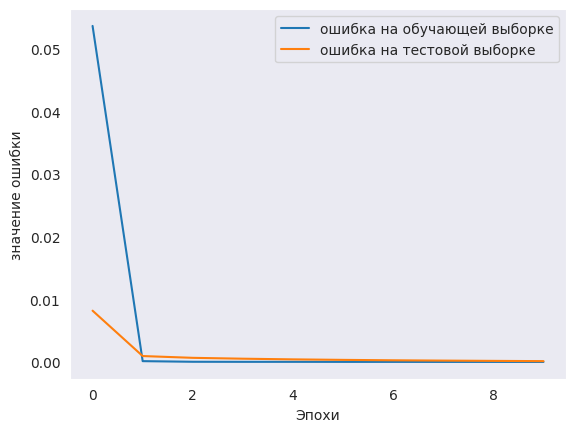

In [239]:
history = model.fit(X2_train,
                    y2_train,
                    batch_size = 20,
                    epochs = 10,
                    validation_data = (X2_test, y2_test))
print(history.history.keys())
plt.plot(history.history['loss'],
         label = 'ошибка на обучающей выборке')
plt.plot(history.history['val_loss'],
         label = 'ошибка на тестовой выборке')
plt.xlabel('Эпохи')
plt.ylabel('значение ошибки')
plt.legend()
plt.show()

In [240]:
y2_pred_model=model.predict(X2_test)

print('Model Results:')
print('Model_MAE: ', round(mean_absolute_error(y2_test, y2_pred_model)))
print('Model_MAPE: {:.2f}'.format(mean_absolute_percentage_error(y2_test, y2_pred_model)))
print("Test score: {:.2f}".format(mean_squared_error(y2_test, y2_pred_model)))

10/10 [==============================] - 0s 2ms/step
Model Results:
Model_MAE:  0
Model_MAPE: 14.74
Test score: 0.00


10/10 [==============================] - 0s 4ms/step


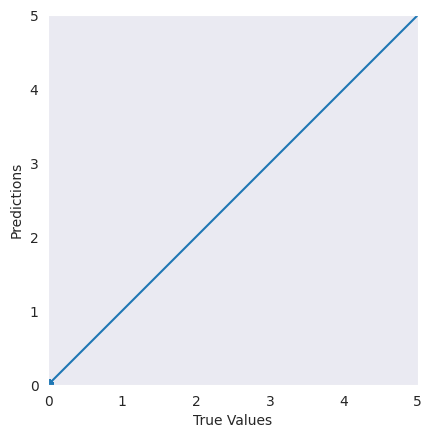

In [241]:
test_predictions = model.predict(X2_test).flatten()

a = plt.axes(aspect='equal')
plt.scatter(y2_test, test_predictions)
plt.xlabel('True Values')
plt.ylabel('Predictions')
lims = [0, 5]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

In [242]:
model.save("models/my_model")

In [246]:
import keras as keras
reconstructed_model = keras.models.load_model("models/my_model")
reconstructed_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 256)               2304      
                                                                 
 batch_normalization_1 (Batc  (None, 256)              1024      
 hNormalization)                                                 
                                                                 
 dense_5 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_6 (Dense)             (None, 64)                8256      
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                      

In [248]:
np.testing.assert_allclose(model.predict(X2_test), 
                           reconstructed_model.predict(X2_test))

10/10 [==============================] - 0s 3ms/step
